<a href="https://colab.research.google.com/github/diaoxinqiang/MNIST_GAN_Demo/blob/master/MNIST_GAN_demo_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MNIST GAN demo
最基础的 GAN ，手敲一遍，对其原理有个初步的了解


In [0]:
import tensorflow as tf

In [0]:
tf.__version__

'1.15.0-rc3'

# 1.定义参数


In [0]:
# 图片尺寸
img_height= 28
img_width = 28
img_size = img_height * img_width

# 
to_train = True
to_restore = False
output_path = "output"

# 迭代次数
max_epoches =500
# 全连接层神经元数量
h1_size= 150
h2_size= 300

# generator 输入vector 噪声 尺寸
z_size =100
# 同时训练多少张图
batch_size = 256


# 2.generator

-  两个全连接层（y= kx + b ）
-  第一层 150个神经元（100*150*2个参数），第二层 300个神经元（150*300*2个参数）。
- 标准差为0.1正态分布，初始化全连接层w参数；b为0；


In [0]:
#  构建生成器 [batch_size,z_size] ---> [batch_size, img_size]
%%time
def build_generator(z_prior):
  #  z_prior 为[batch_size,z_size]的矩阵;
  #  2个全连接层： 150---->300---> 784(28*28) 
  # 疑问：这样构建全连接层，tf 应该有直接提供fully connect的API

  # 1. f1    ps: truncated_normal:产生随机的标准差为0.1的正态分布值，尺寸为 [z_size,h1_size]的矩阵
  w1= tf.Variable(tf.truncated_normal([z_size,h1_size],stddev=0.1),name='g_w1',dtype=tf.float32)
  b1 = tf.Variable(tf.zeros([h1_size]),name='g_b1',dtype= tf.float32)
  # f1 输出 为 [batch_size,h1_size]的矩阵; 
  # 加入 relu 起到非线性拟合作用，换成 【leakyRelu】效果十分会更好？
  f1 = tf.nn.relu(tf.matmul(z_prior,w1)+b1)

  # 2. f2
  w2= tf.Variable(tf.truncated_normal([h1_size,h2_size],stddev=0.1),name='g_w2',dtype=tf.float32)
  b2 = tf.Variable(tf.zeros([h2_size]),name='g_b2',dtype= tf.float32)
  # f2 : [batch_size,h2_size]矩阵
  f2 = tf.nn.relu(tf.matmul(f1,w2)+b2)


  # 3. 输出层
  w3= tf.Variable(tf.truncated_normal([h2_size,img_size],stddev=0.1),name='g_w3',dtype=tf.float32)
  b3 = tf.Variable(tf.zeros([img_size]),name='g_b3',dtype= tf.float32)
  # f3: [batch_size,img_size]矩阵
  f3 = tf.matmul(f2,w3)+b3
  #  双曲正切函数 将值值置为 [-1，1]，为什么要使用tanh
  x_generate= tf.nn.tanh(f3)
  g_params = [w1,b1,w2,b2,w3,b3]
  return x_generate,g_params

  

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.44 µs


#  3.Discriminator


In [0]:
# 辨别器  
def build_discriminator(x_data,x_generate,keep_prob):
  # x_data，x_generate ：[batch_size,img_size]矩阵
  x_input = tf.concat([x_data,x_generate],0) # 在0维度上进行concat拼接
  # 2个全连接层：  784(28*28)----> 300---> 150

  # f1: [batch_size*2,h2_size]矩阵
  w1= tf.Variable(tf.truncated_normal([img_size,h2_size],stddev=0.1),name='d_w1',dtype=tf.float32)
  b1 = tf.Variable(tf.zeros([h2_size]),name='d_b1',dtype= tf.float32)
  # dropout: 随机放弃部分神经元，防止过拟合；
  # keep_prob作用:以一定的概率p，让其停止工作，这次训练过程中不更新权值
  f1 = tf.nn.dropout( tf.nn.relu(tf.matmul(x_input,w1)+b1),keep_prob)

  # f2: [batch_size*2,h1_size]
  w2= tf.Variable(tf.truncated_normal([h2_size,h1_size],stddev=0.1),name='d_w2',dtype=tf.float32)
  b2 = tf.Variable(tf.zeros([h1_size]),name='d_b2',dtype= tf.float32)
  f2 = tf.nn.dropout( tf.nn.relu(tf.matmul(f1,w2)+b2),keep_prob)

  # 输出层f3: [batch_size*2,1] 矩阵
  w3= tf.Variable(tf.truncated_normal([h1_size,1],stddev=0.1),name='d_w3',dtype=tf.float32)
  b3 = tf.Variable(tf.zeros([1]),name='d_b3',dtype= tf.float32)
  f3 = tf.matmul(f2,w3)+b3
  # sigmoid 输出概率
  y_data = tf.nn.sigmoid(tf.slice(f3,[0,0],[batch_size,-1],name=None))
  y_generated = tf.nn.sigmoid(tf.slice(f3, [batch_size, 0], [-1, -1], name=None))
  d_params = [w1, b1, w2, b2, w3, b3]
  return y_data,y_generated,d_params




# 4.保存图片

In [0]:
from skimage.io import imsave
def show_result(batch_res, fname, grid_size=(8, 8), grid_pad=5):
    batch_res = 0.5 * batch_res.reshape((batch_res.shape[0], img_height, img_width)) + 0.5
    img_h, img_w = batch_res.shape[1], batch_res.shape[2]
    grid_h = img_h * grid_size[0] + grid_pad * (grid_size[0] - 1)
    grid_w = img_w * grid_size[1] + grid_pad * (grid_size[1] - 1)
    img_grid = np.zeros((grid_h, grid_w), dtype=np.uint8)
    for i, res in enumerate(batch_res):
        if i >= grid_size[0] * grid_size[1]:
            break
        img = (res) * 255
        img = img.astype(np.uint8)
        row = (i // grid_size[0]) * (img_h + grid_pad)
        col = (i % grid_size[1]) * (img_w + grid_pad)
        img_grid[row:row + img_h, col:col + img_w] = img
    imsave(fname, img_grid)

# 5.Train 

In [0]:
%%time
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np

import os
import shutil

def train():
  # load mnist dataset , 初始化输入值
  mnist = input_data.read_data_sets('MNIST_data',one_hot= True)
  x_data= tf.placeholder(tf.float32,[batch_size,img_size],name='x_data')
  z_prior = tf.placeholder(tf.float32,[batch_size,z_size],name='z_prior')
  keep_prob = tf.placeholder(tf.float32,name='keep_prob')
  global_step = tf.Variable(0,name='global_step',trainable=False)
  
  x_generated,g_params= build_generator(z_prior)
  y_data,y_generated,d_params= build_discriminator(x_data,x_generated,keep_prob)
  
  #  Loss
  d_loss= - (tf.log(y_data)+tf.log(1-y_generated))
  g_loss= - tf.log(y_generated)

  optimizer = tf.train.AdamOptimizer(0.0001)

  d_trainer = optimizer.minimize(d_loss,var_list = d_params)
  g_trainer = optimizer.minimize(g_loss,var_list = g_params)

  init = tf.global_variables_initializer()
  saver = tf.train.Saver()

  sess = tf.Session()
  sess.run(init)

  # 保存模型
  if to_restore:
    chkpt_fname= tf.train.latest_checkpoint(output_path)
    saver.restore(sess,chkpt_fname)
  else:
    if os.path.exists(output_path):
      shutil.rmtree(output_path)
    os.mkdir(output_path)
  # 验证的噪声vector
  z_sample_val = np.random.normal(0,1,size=(batch_size,z_size)).astype(np.float32)

  steps = 60000/batch_size
  for i in range(sess.run(global_step),max_epoches):
    print('epoches:%s'%(i))
    for j in np.arange(steps):
     
      x_value,_= mnist.train.next_batch(batch_size)
      # ？？？具体什么作用？？？
      x_value = 2*x_value.astype(np.float32)-1
      z_value = np.random.normal(0,1,size= (batch_size,z_size)).astype(np.float32)
      # 先跑 discriminater?
      sess.run(d_trainer,feed_dict={
          x_data:x_value,z_prior:z_value,keep_prob: 0.7
      })
      # 后跑 generator? 
      if j % 1 == 0:
          sess.run(g_trainer,feed_dict={
              x_data: x_value, z_prior: z_value, keep_prob: 0.7
          })
    x_gen_val = sess.run(x_generated, feed_dict={z_prior: z_sample_val})
    show_result(x_gen_val, "output/sample{0}.jpg".format(i))
    z_random_sample_val = np.random.normal(0, 1, size=(batch_size, z_size)).astype(np.float32)
    x_gen_val = sess.run(x_generated, feed_dict={z_prior: z_random_sample_val})
    show_result(x_gen_val, "output/random_sample{0}.jpg".format(i))
    sess.run(tf.assign(global_step, i + 1))
    saver.save(sess, os.path.join(output_path, "model"), global_step=global_step)






CPU times: user 521 ms, sys: 137 ms, total: 658 ms
Wall time: 1.44 s


In [0]:
%%time
train()

Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
Instructions for updating:
Please write your own downloading logic.
Instructions for updating:
Please use urllib or similar directly.
Successfully downloaded train-images-idx3-ubyte.gz 9912422 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting MNIST_data/train-images-idx3-ubyte.gz
Successfully downloaded train-labels-idx1-ubyte.gz 28881 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Instructions for updating:
Please use tf.one_hot on tensors.
Successfully downloaded t10k-images-idx3-ubyte.gz 1648877 bytes.
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Successfully downloaded t10k-labels-idx1-ubyte.gz 4542 bytes.
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py fr

#  6.Show Results

epoches:0


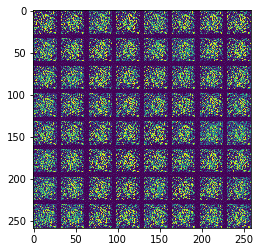

epoches:5


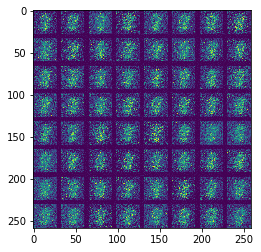

epoches:10


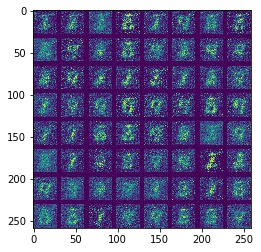

epoches:15


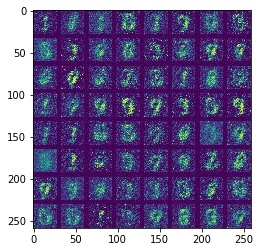

epoches:20


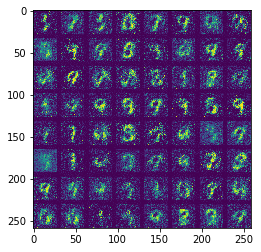

epoches:25


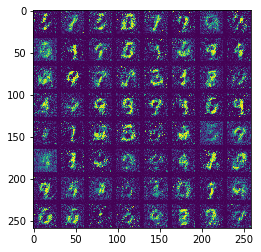

epoches:30


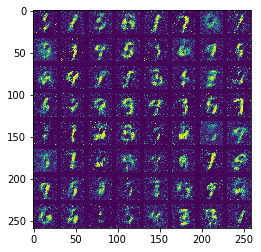

epoches:35


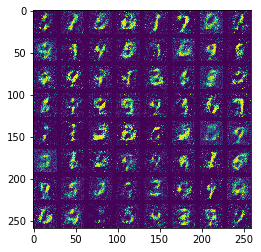

epoches:40


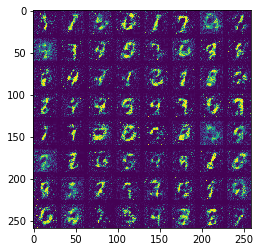

epoches:45


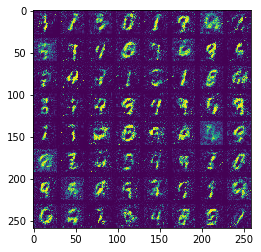

epoches:50


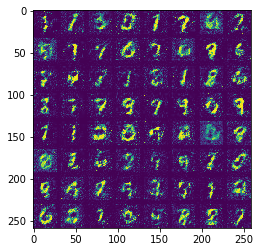

epoches:55


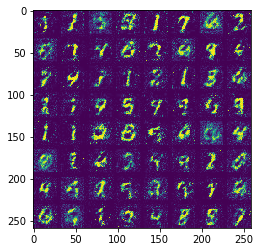

epoches:60


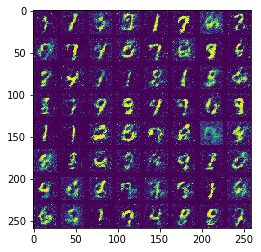

epoches:65


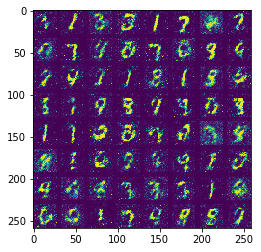

epoches:70


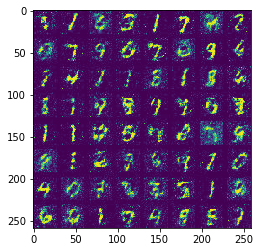

epoches:75


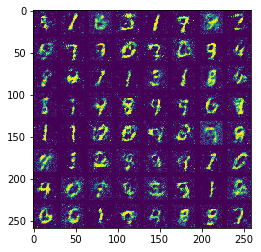

epoches:80


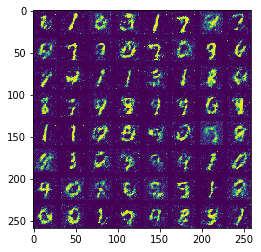

epoches:85


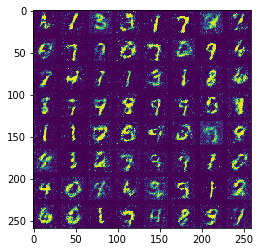

epoches:90


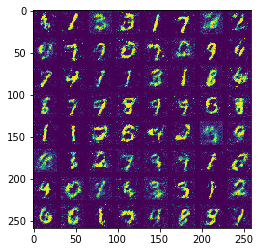

epoches:95


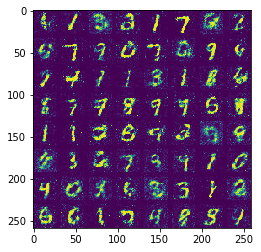

epoches:100


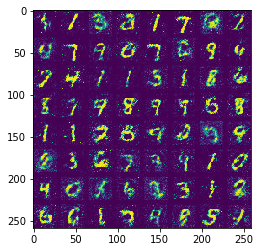

epoches:105


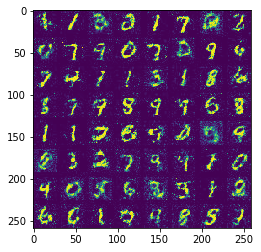

epoches:110


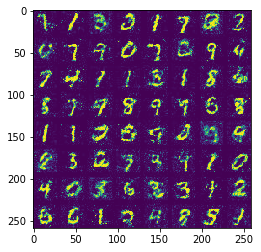

epoches:115


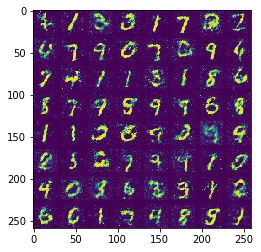

epoches:120


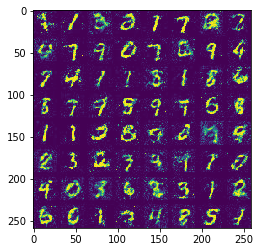

epoches:125


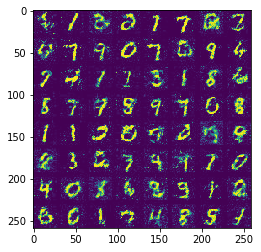

epoches:130


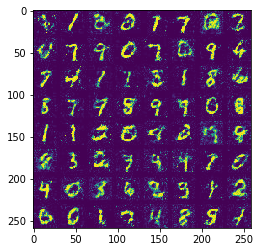

epoches:135


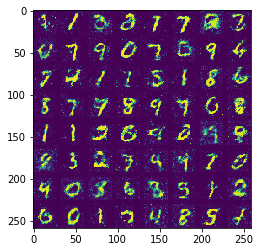

epoches:140


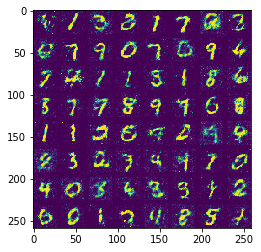

epoches:145


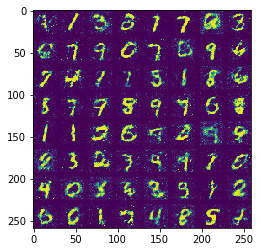

epoches:150


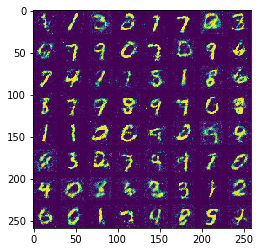

epoches:155


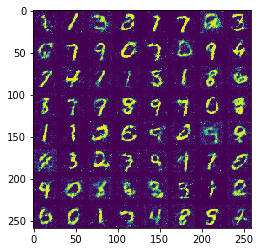

epoches:160


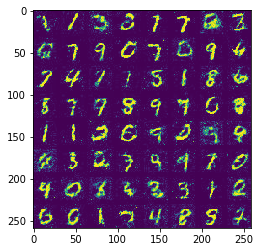

epoches:165


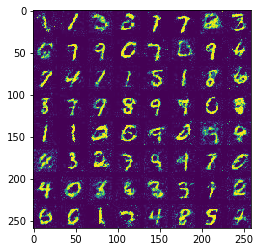

epoches:170


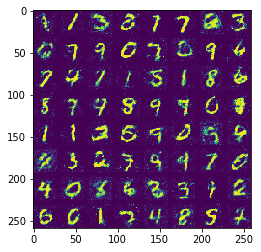

epoches:175


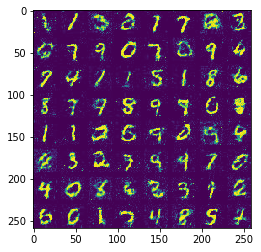

epoches:180


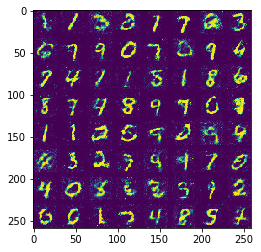

epoches:185


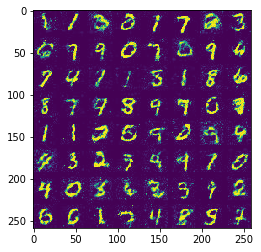

epoches:190


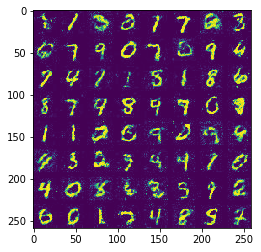

epoches:195


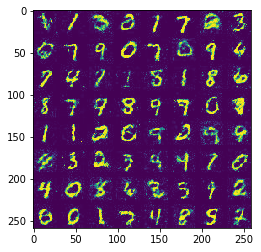

epoches:200


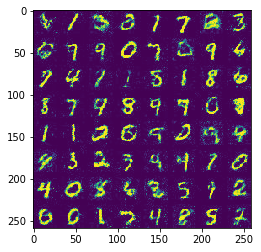

epoches:205


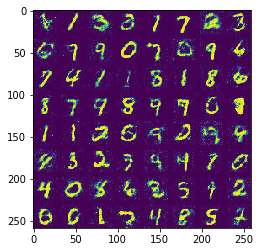

epoches:210


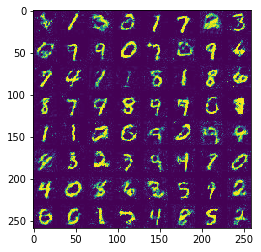

epoches:215


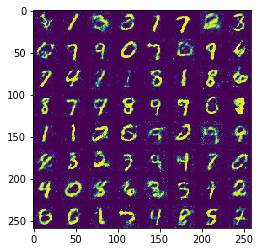

epoches:220


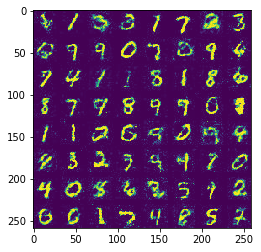

epoches:225


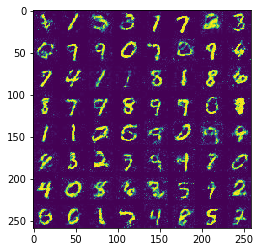

epoches:230


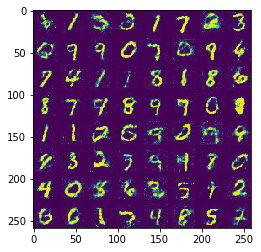

epoches:235


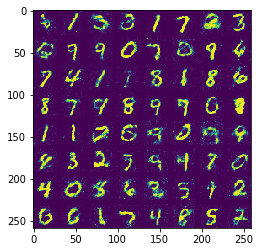

epoches:240


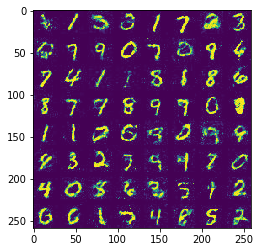

epoches:245


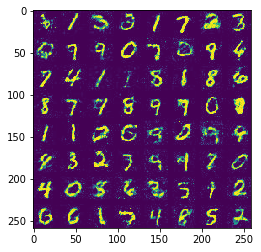

epoches:250


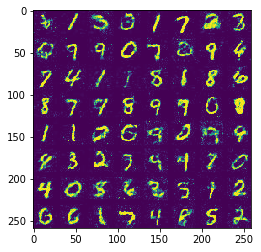

epoches:255


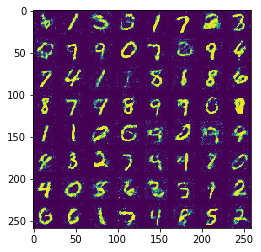

epoches:260


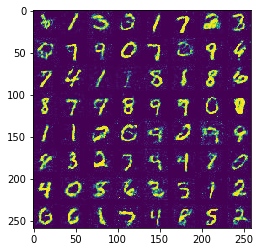

epoches:265


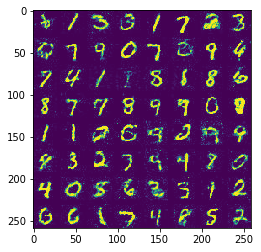

epoches:270


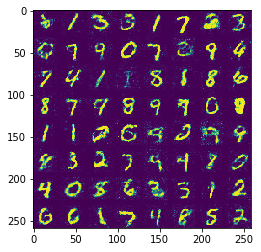

epoches:275


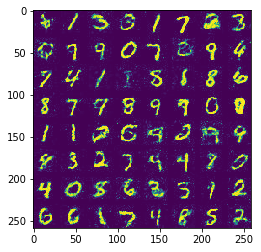

epoches:280


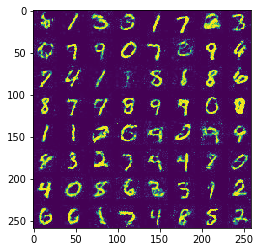

epoches:285


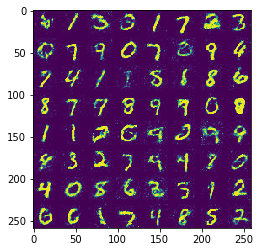

epoches:290


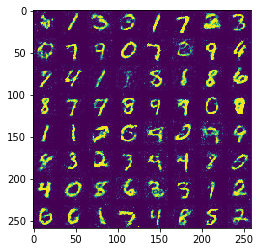

epoches:295


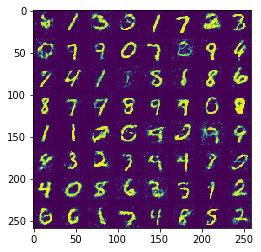

epoches:300


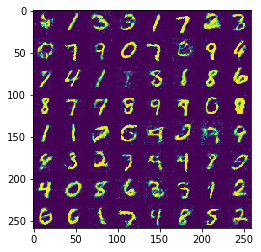

epoches:305


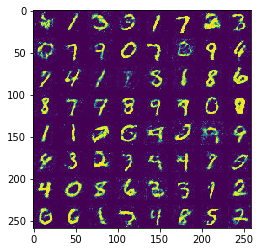

epoches:310


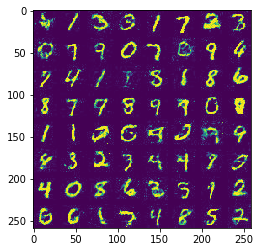

epoches:315


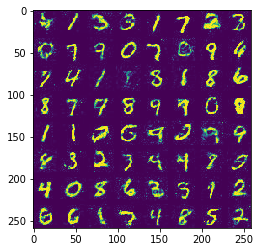

epoches:320


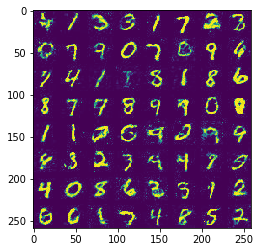

epoches:325


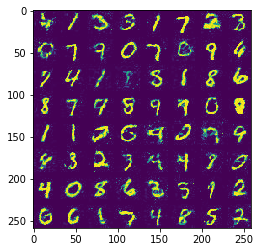

epoches:330


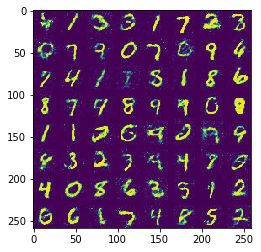

epoches:335


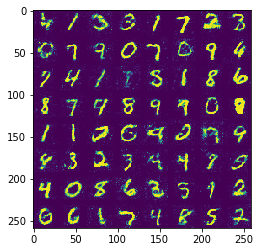

epoches:340


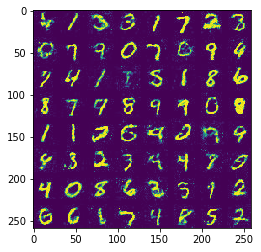

epoches:345


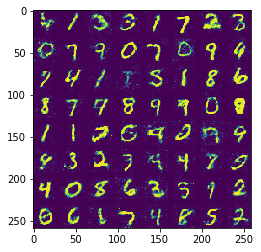

epoches:350


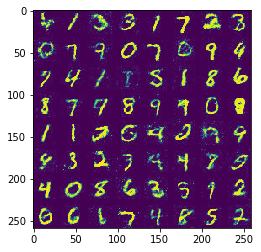

epoches:355


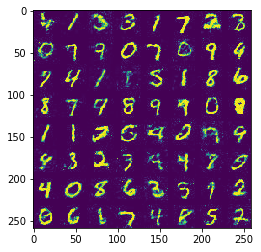

epoches:360


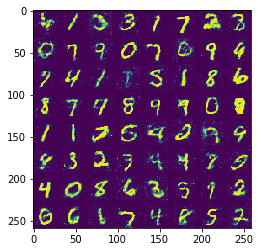

epoches:365


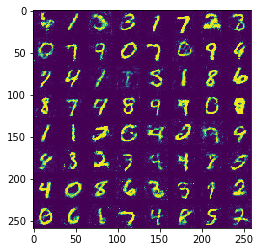

epoches:370


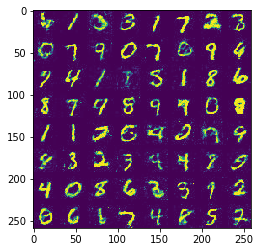

epoches:375


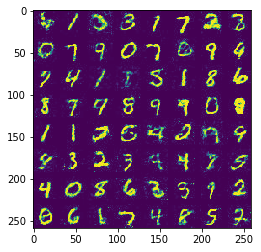

epoches:380


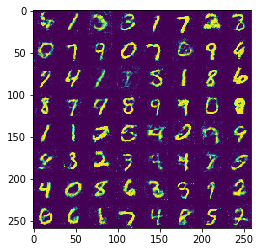

epoches:385


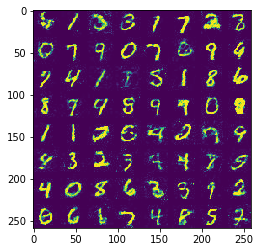

epoches:390


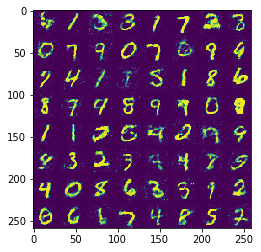

epoches:395


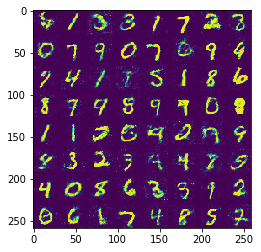

epoches:400


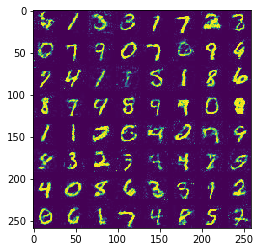

epoches:405


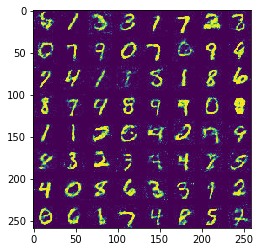

epoches:410


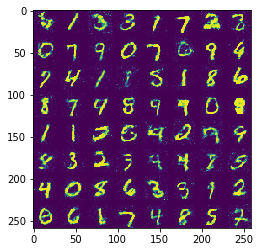

epoches:415


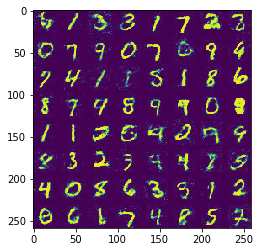

epoches:420


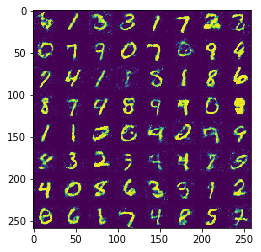

epoches:425


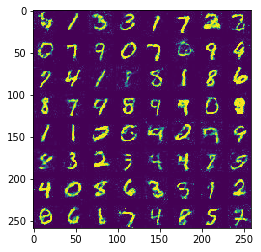

epoches:430


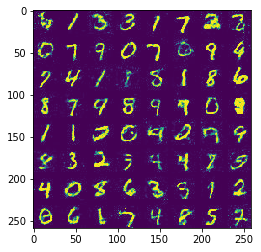

epoches:435


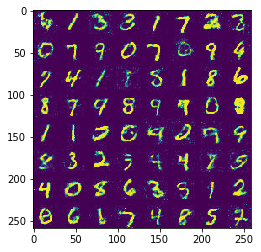

epoches:440


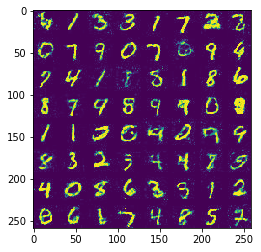

epoches:445


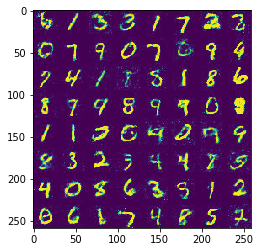

epoches:450


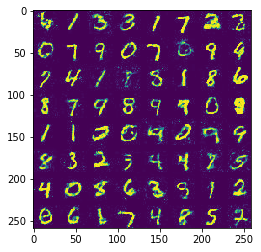

epoches:455


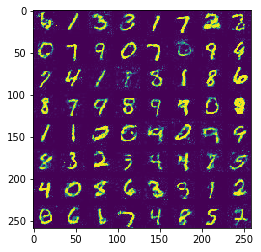

epoches:460


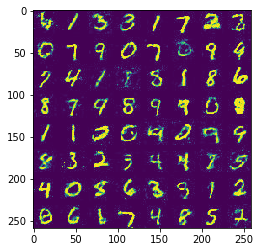

epoches:465


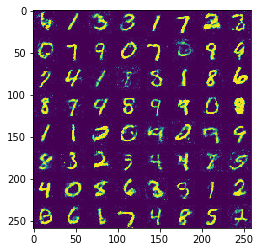

epoches:470


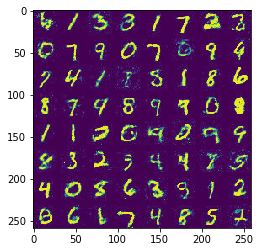

epoches:475


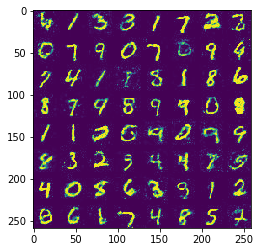

epoches:480


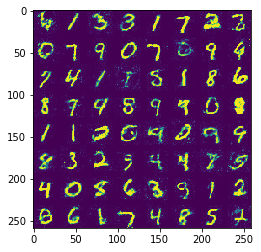

epoches:485


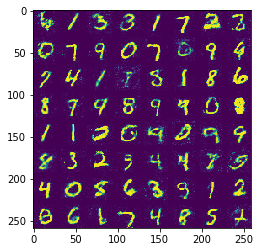

epoches:490


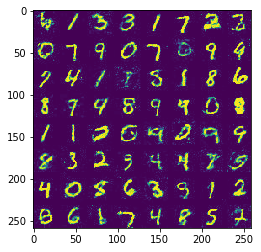

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
for i in range(99):
  index = i*5
  file_path  = "output/sample%s.jpg"%index
  print('epoches:%s'%index)
  img = Image.open(file_path)
  # print(img.mode)
  plt.figure("img")
  plt.imshow(img)
  plt.show()
